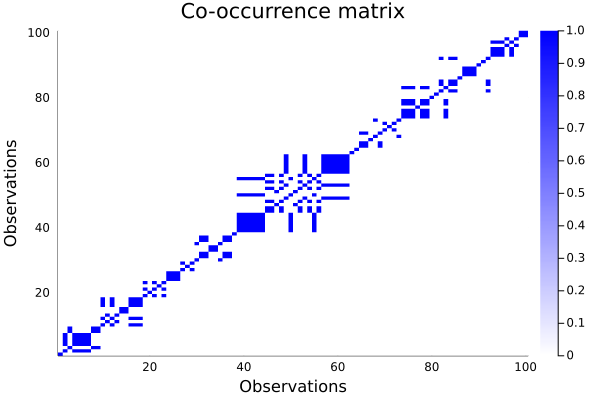

In [1]:
include("../ntl.jl")
import Random

using LinearAlgebra
Random.seed!(1)


dirichlet_scale = ones(Float64, 10)
data_parameters = Ntl.Models.MultinomialParameters(10, dirichlet_scale)

psi_prior = Vector{Float64}([1, 1])
phi_prior = Vector{Float64}([1, 1])
geometric_arrival = Ntl.Models.GeometricArrivals(prior=phi_prior, sample_parameter_posterior=true)
ntl_cluster_parameters = Ntl.Models.NtlParameters(
    psi_prior, 
    geometric_arrival, 
    sample_parameter_posterior=false
)

mixture_model = Ntl.Models.Mixture(ntl_cluster_parameters, data_parameters)
n = 100
mixture = Ntl.Generate.generate(mixture_model, n=n)
data = Matrix(transpose(Matrix(mixture[:, 2:end])))
training_data = data[:, 1:n]
true_clustering = mixture[:, 1]
true_number_of_clusters = length(unique(true_clustering))
Ntl.Plot.plot_co_occurrence_matrix(true_clustering)

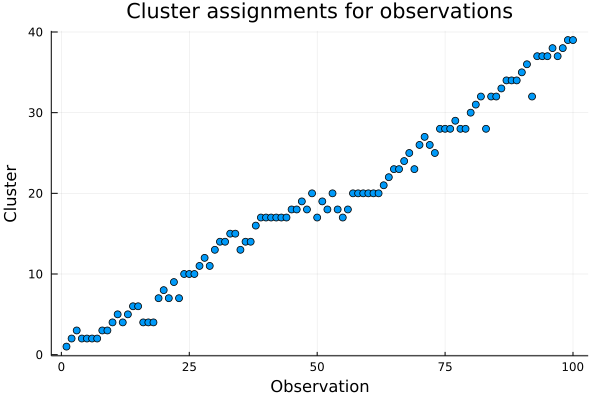

In [2]:
Ntl.Plot.plot_assignments(true_clustering)

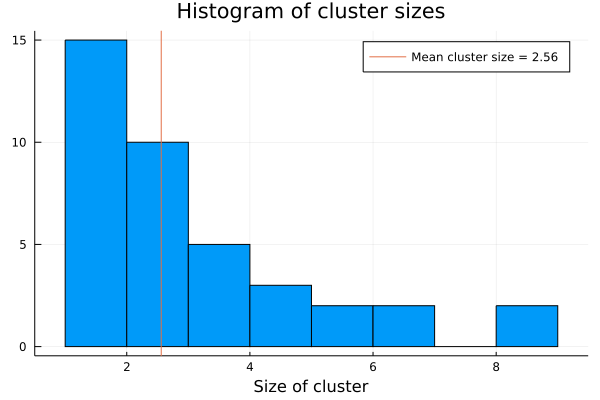

In [3]:
Ntl.Plot.plot_cluster_sizes_histogram(true_clustering)

In [4]:
gibbs_sampler = Ntl.Samplers.GibbsSampler(
    num_iterations=3000, 
    num_burn_in=0, 
    assignment_types=[
        "random", 
        "all same cluster", 
        "all different clusters"
        ]
)
gibbs_output = Ntl.Fitter.fit(training_data, mixture_model, gibbs_sampler)

Progress: 100%|█████████████████████████████████████████| Time: 0:04:19
Progress: 100%|█████████████████████████████████████████| Time: 0:04:38
Progress: 100%|█████████████████████████████████████████| Time: 0:05:08


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 2 1 … 1 2; … ; 92 65 … 99 99; 71 100 … 100…
  "arrival posterior" => [0.0920929 0.00828566 0.993541; 0.164699 0.00943134 0.…
  "log likelihood"    => [-2539.36 -2314.25 -2192.25; -2367.14 -2314.25 -2219.0…

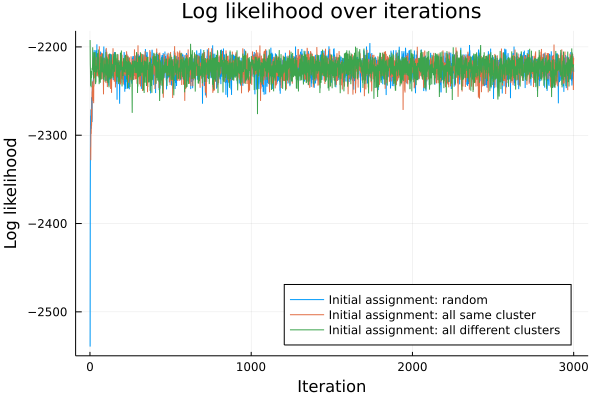

In [5]:
Ntl.Plot.plot_log_likelihoods(
    gibbs_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types,
    legend_location=:bottomright
)

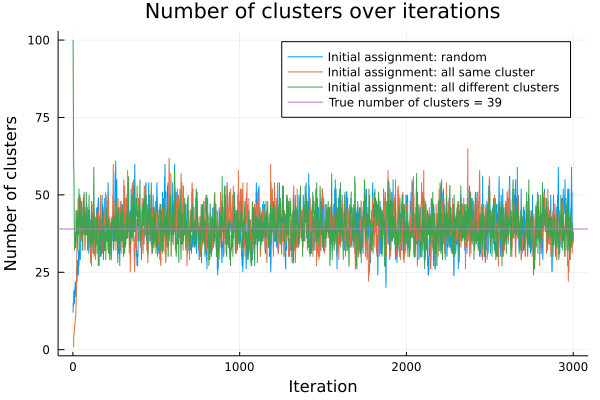

In [6]:
Ntl.Plot.plot_num_clusters(
    gibbs_output["assignments"], 
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

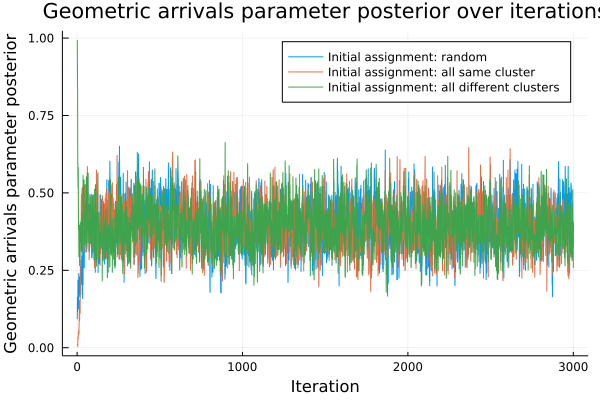

In [7]:
Ntl.Plot.plot_trace(
    gibbs_output["arrival posterior"], 
    ylabel="Geometric arrivals parameter posterior",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


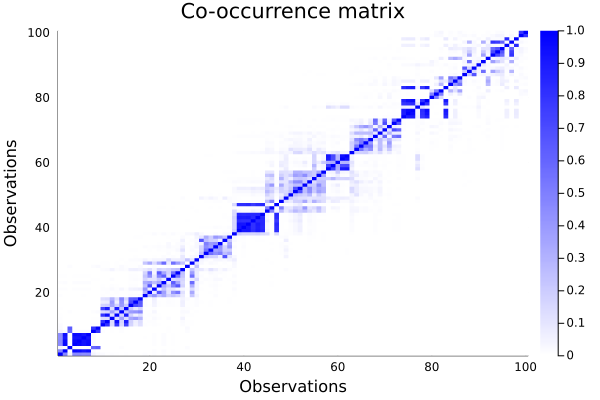

In [8]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_output["assignments"][:, :, 1], num_burn_in=1500)

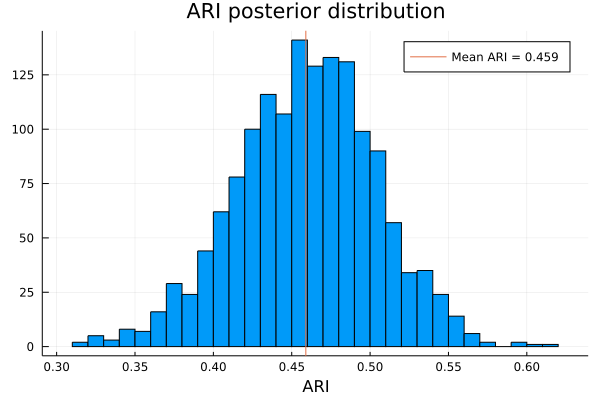

In [9]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)

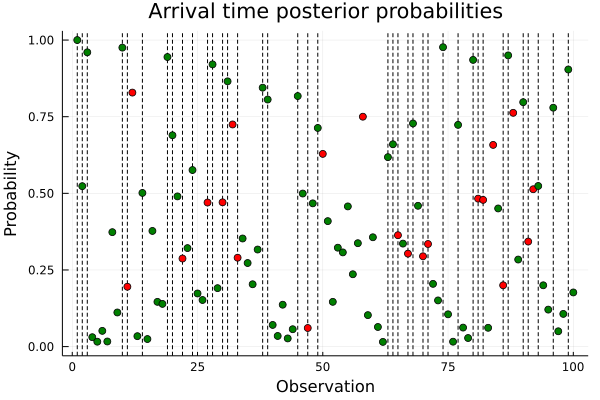

In [10]:
Ntl.Plot.plot_arrival_posterior_probabilities(
    gibbs_output["assignments"][:, :, 1], 
    true_clustering, 
    num_burn_in=1500
)

In [11]:
gibbs_map_estimate = Ntl.Utils.map_estimate(
    gibbs_output["assignments"][:, :, 1], 
    gibbs_output["log likelihood"][:, 1], 
    num_burn_in=1500
)
gibbs_map_ari = Ntl.Utils.adjusted_rand_index(gibbs_map_estimate, true_clustering)
println("MAP Estimate ARI = $gibbs_map_ari")

MAP Estimate ARI = 0.4952608435445241


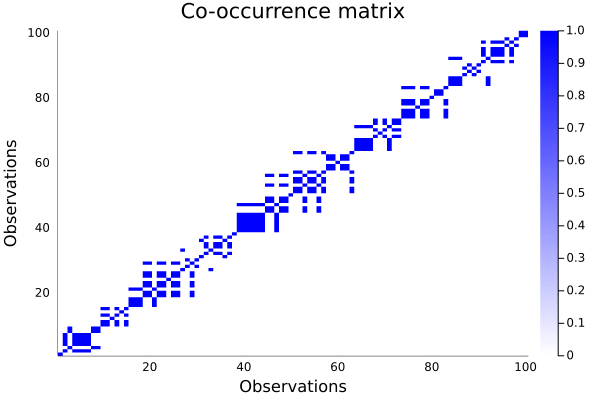

In [12]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_map_estimate)

In [13]:
gibbs_minbinder_estimate = Ntl.Utils.minbinder(
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)
gibbs_minbinder_ari = Ntl.Utils.adjusted_rand_index(gibbs_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $gibbs_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
┌ Warning: RCall.jl: Loading required package: lpSolve
└ @ RCall /Users/seanla/.julia/packages/RCall/3mHXJ/src/io.jl:160


MinBinder estimate ARI = 0.4963925086266099


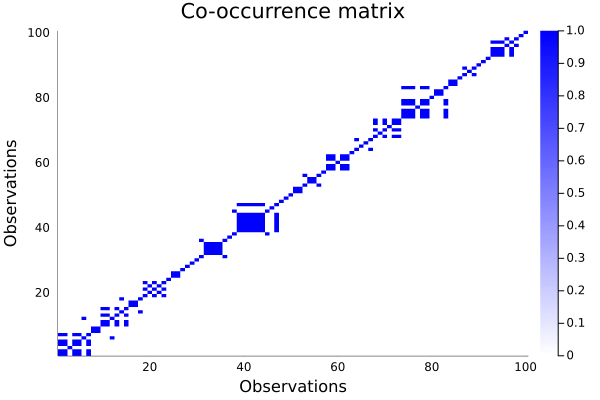

In [14]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minbinder_estimate)

In [15]:
gibbs_minVI_estimate = Ntl.Utils.minVI(
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)
gibbs_minVI_ari = Ntl.Utils.adjusted_rand_index(gibbs_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $gibbs_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


Min VI Estimate ARI = 0.5571813047268865


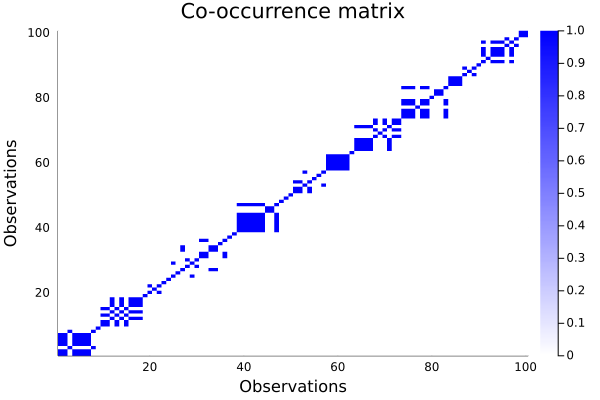

In [16]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minVI_estimate)

In [17]:
metropolis_hastings_sampler = Ntl.Samplers.MetropolisHastingsSampler(
    num_iterations=10000, 
    num_burn_in=0, 
    proposal_radius=5, 
    skip=1, 
    adaptive=false,                                                  
    assignment_types=[
        "random", 
        "all same cluster", 
        "all different clusters"
    ]
)
mcmc_output = Ntl.Fitter.fit(training_data, mixture_model, metropolis_hastings_sampler) 

Progress: 100%|█████████████████████████████████████████| Time: 0:00:15
Progress: 100%|█████████████████████████████████████████| Time: 0:00:15
Progress: 100%|█████████████████████████████████████████| Time: 0:00:16


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 1 … 1 1; … ; 44 44 … 99 99; 68 68 … 99 9…
  "arrival posterior" => [0.0888419 0.0103275 0.990024; 0.0896678 0.00115302 0.…
  "log likelihood"    => [-2458.24 -2314.25 -2192.25; -2428.79 -2314.25 -2193.8…

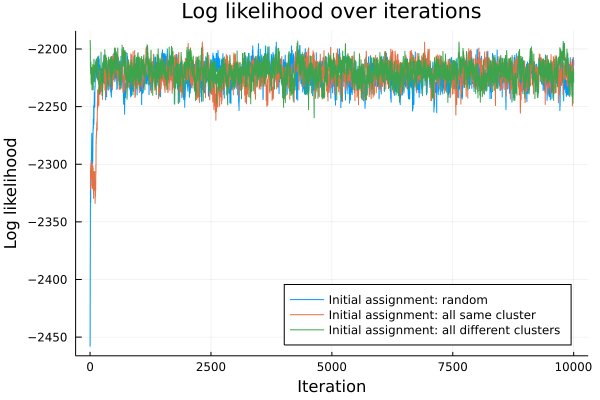

In [18]:
Ntl.Plot.plot_log_likelihoods(
    mcmc_output["log likelihood"],
    assignment_types=metropolis_hastings_sampler.assignment_types,
    legend_location=:bottomright
)

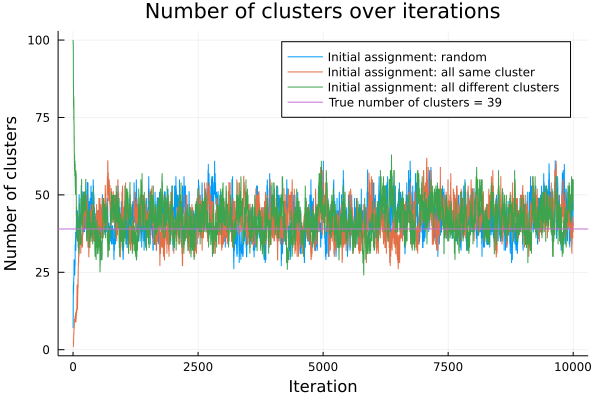

In [19]:
Ntl.Plot.plot_num_clusters(
    mcmc_output["assignments"], 
    true_number=true_number_of_clusters,
    assignment_types=metropolis_hastings_sampler.assignment_types
)

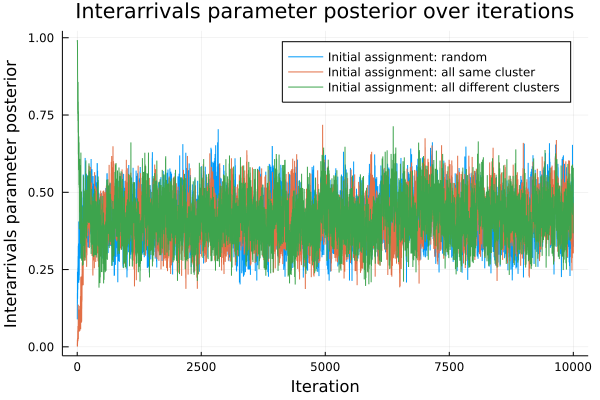

In [20]:
Ntl.Plot.plot_trace(
    mcmc_output["arrival posterior"], 
    ylabel="Interarrivals parameter posterior",
    assignment_types=metropolis_hastings_sampler.assignment_types
)

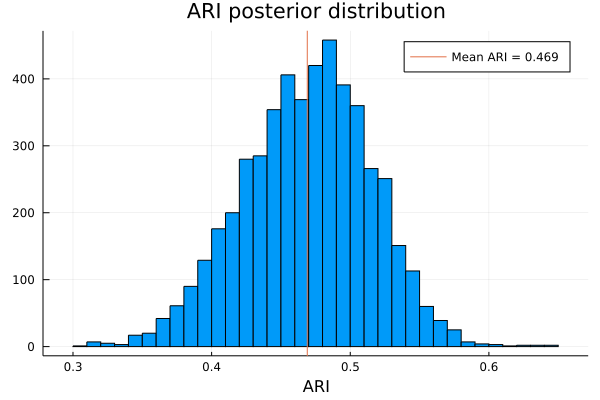

In [21]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


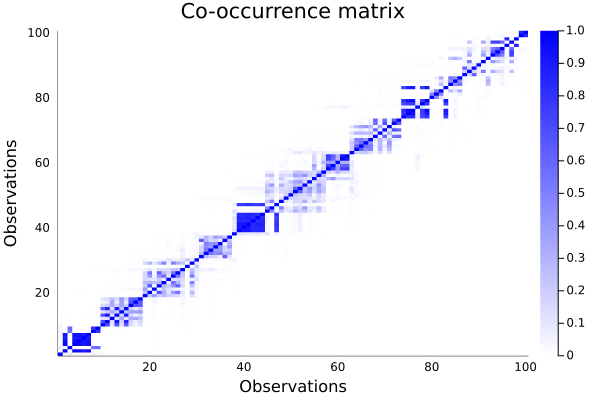

In [22]:
Ntl.Plot.plot_co_occurrence_matrix(
    mcmc_output["assignments"][:, :, 1],
    num_burn_in=5000
)

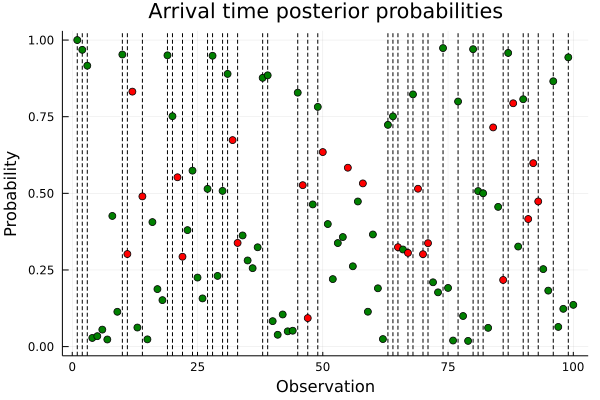

In [23]:
Ntl.Plot.plot_arrival_posterior_probabilities(
    mcmc_output["assignments"][:, :, 1], 
    true_clustering,
    num_burn_in=5000
)

In [24]:
mcmc_map_estimate = Ntl.Utils.map_estimate(
    mcmc_output["assignments"][:, :, 1], 
    mcmc_output["log likelihood"][:, 1], 
    num_burn_in=5000
)
mcmc_map_ari = Ntl.Utils.adjusted_rand_index(mcmc_map_estimate, true_clustering)
println("MAP Estimate ARI = $mcmc_map_ari")

MAP Estimate ARI = 0.5358235446802191


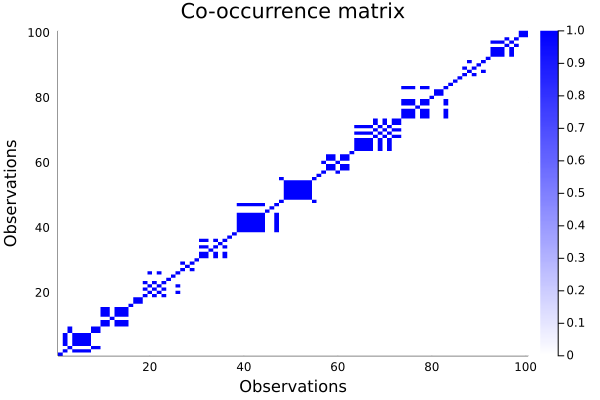

In [25]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_map_estimate)

In [26]:
mcmc_minbinder_estimate = Ntl.Utils.minbinder(
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)
mcmc_minbinder_ari = Ntl.Utils.adjusted_rand_index(mcmc_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $mcmc_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


MinBinder estimate ARI = 0.5184784868010803


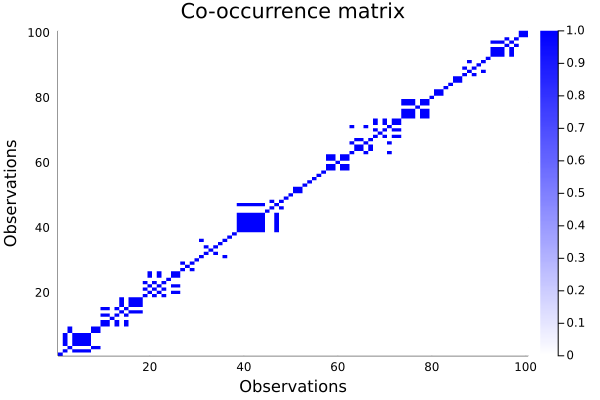

In [27]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minbinder_estimate)

In [28]:
mcmc_minVI_estimate = Ntl.Utils.minVI(
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)
mcmc_minVI_ari = Ntl.Utils.adjusted_rand_index(mcmc_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $mcmc_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


Min VI Estimate ARI = 0.5498202079152044


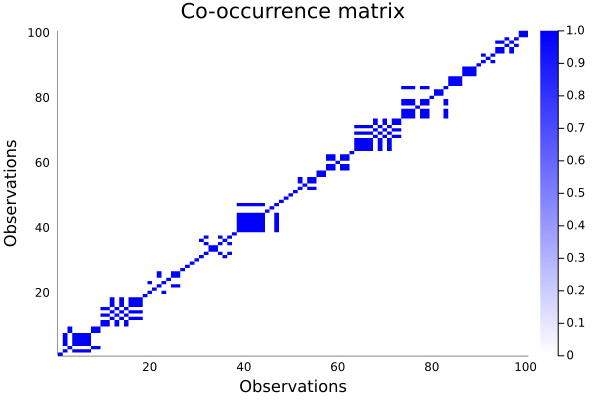

In [29]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minVI_estimate)

In [30]:
dp_cluster_parameters = Ntl.Models.DpParameters(1, sample_parameter_posterior=true)
dp_mixture = Ntl.Models.Mixture(dp_cluster_parameters, data_parameters)
gibbs_sampler = Ntl.Samplers.GibbsSampler(
    num_iterations=50000, 
    num_burn_in=0,            
    assignment_types=["random", "all same cluster", "all different clusters"]
)
dp_output = Ntl.Fitter.fit(training_data, dp_mixture, gibbs_sampler)

Progress: 100%|█████████████████████████████████████████| Time: 0:06:01
Progress: 100%|█████████████████████████████████████████| Time: 0:05:57
Progress: 100%|█████████████████████████████████████████| Time: 0:05:56


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 2 … 2 2; … ; 27 1 … 45 50; 36 24 … 3 3]…
  "cluster parameter" => [1.0 1.0 1.0; 1.0 1.27463 1.0; … ; 17.9959 28.1591 29.…
  "log likelihood"    => [-2457.57 -2314.25 -2551.38; -2347.39 -2312.41 -2405.3…

In [31]:
Ntl.Plot.plot_log_likelihoods(
    dp_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types,
    legend_location=:bottomright
)

In [32]:
Ntl.Plot.plot_num_clusters(
    dp_output["assignments"],
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

In [33]:
Ntl.Plot.plot_trace(
    dp_output["cluster parameter"],
    ylabel="alpha",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


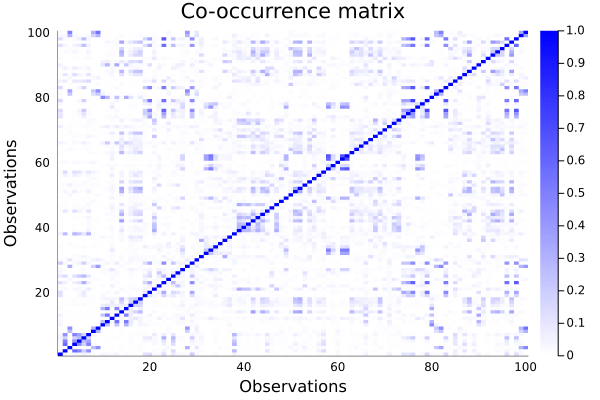

In [47]:
Ntl.Plot.plot_co_occurrence_matrix(dp_output["assignments"][:, :, 1], num_burn_in=25000)

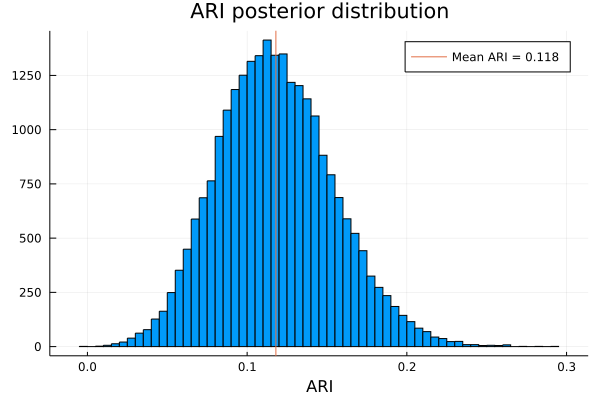

In [48]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)

In [49]:
dp_map_estimate = Ntl.Utils.map_estimate(
    dp_output["assignments"][:, :, 1], 
    dp_output["log likelihood"][:, 1], 
    num_burn_in=25000
)
dp_map_ari = Ntl.Utils.adjusted_rand_index(dp_map_estimate, true_clustering)
println("MAP Estimate ARI = $dp_map_ari")

MAP Estimate ARI = 0.15937164227588002


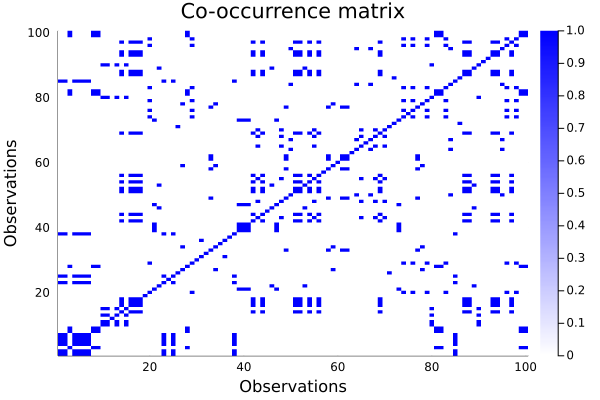

In [50]:
Ntl.Plot.plot_co_occurrence_matrix(dp_map_estimate)

In [51]:
dp_minbinder_estimate = Ntl.Utils.minbinder(
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)
dp_minbinder_ari = Ntl.Utils.adjusted_rand_index(dp_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $dp_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


MinBinder estimate ARI = 0.09348667753979846


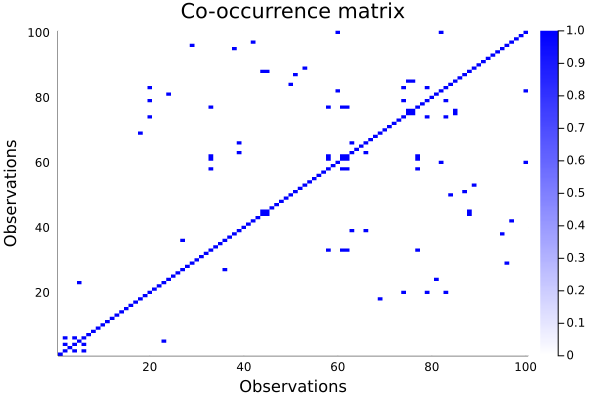

In [52]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minbinder_estimate)

In [53]:
dp_minVI_estimate = Ntl.Utils.minVI(
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)
dp_minVI_ari = Ntl.Utils.adjusted_rand_index(dp_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $dp_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:13


Min VI Estimate ARI = 0.1542002069259655


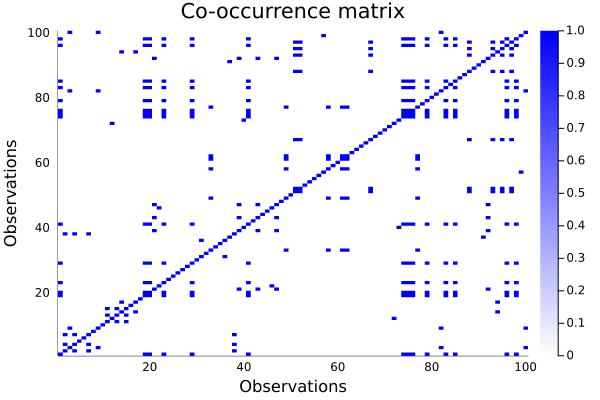

In [54]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minVI_estimate)

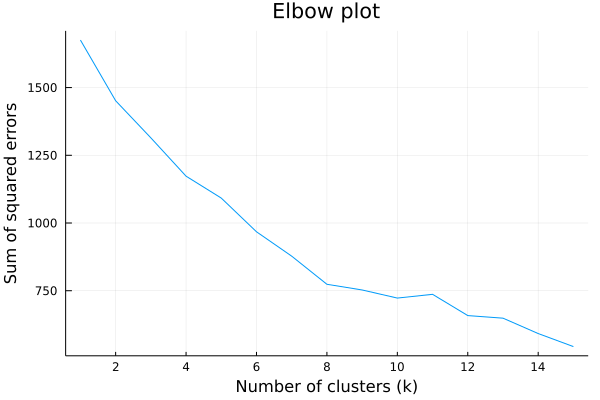

In [42]:
Ntl.Plot.plot_kmeans_elbow(training_data, max_num_clusters=15)

In [43]:
using Clustering
kmeans_num_clusters = 10
final_kmeans_result = kmeans(training_data, kmeans_num_clusters)
kmeans_clustering = final_kmeans_result.assignments

100-element Vector{Int64}:
 1
 3
 2
 3
 3
 3
 3
 2
 2
 4
 9
 8
 9
 ⋮
 8
 9
 4
 6
 6
 6
 6
 3
 6
 1
 2
 2

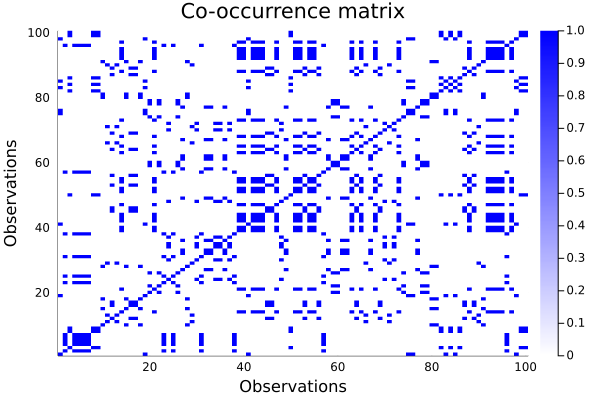

In [44]:
Ntl.Plot.plot_co_occurrence_matrix(kmeans_clustering)

In [45]:
kmeans_ari = Ntl.Utils.adjusted_rand_index(kmeans_clustering, true_clustering)
print("K-means clustering ARI = $kmeans_ari")

K-means clustering ARI = 0.14485841075640066